<a href="https://colab.research.google.com/github/sanu1230/Academic-Project/blob/master/EDA_version_2_NYC_Property_Sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EDA -NYC Property Sales - Case study: Linear regression model to predict sales price of properties

## Business Objective 

This dataset contains properties sold in New York City over a 12-month period from September 2016 to September 2017. The objective is to build a model to predict sale value in the future.

## Load Dataset

In [ ]:
!pip -q install pandas_profiling==2.5.0

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


In [ ]:
#Download dataset # bash commndas 
import pandas as pd
import requests
import pandas_profiling


!wget -q https://www.dropbox.com/s/6tc7e6rc395c7jz/nyc-property-sales.zip


In [ ]:
#Unzip the data  # bash commands 
!unzip nyc-property-sales.zip > /dev/null; echo "Done."

replace nyc-rolling-sales.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
Done.


In [ ]:
!ls

nyc-property-sales.zip	  nyc-rolling-sales.csv  sample_data
nyc-property-sales.zip.1  property_data.html


In [ ]:
#Install Packages
!pip -q install imgaug==0.2.5
!pip -q install plotly-express
!pip -q install shap
!pip -q install eli5
!pip -q install lime

## Import Packages

In [ ]:
#Import basic packages

import warnings
warnings.filterwarnings("ignore")
import time
import pandas as pd               
import numpy as np
import pickle
import datetime

from sklearn.model_selection import train_test_split   #splitting data
from pylab import rcParams

# sklearn -- scikit learn -- ML Model Library - ALL ML Models (Big Ones) are present here. 

from sklearn.linear_model import LinearRegression         #linear regression
from sklearn.metrics.regression import mean_squared_error #error metrics
from sklearn.metrics import mean_absolute_error

import seaborn as sns                       #vis  ualisation
import matplotlib.pyplot as plt             #visualisation

%matplotlib inline   
# for you to show any graph on Notebooks - you need this magic fucntion    
sns.set(color_codes=True)
import plotly_express as px



# Load Data



## 1. Through Pandas

In [ ]:
# Read data through Pandas and compute time taken to read

t_start = time.time()
df_prop = pd.read_csv('nyc-rolling-sales.csv')
t_end = time.time()
print('pd.read_csv(): {} s'.format(t_end-t_start)) # time [s]
df_prop.head()

pd.read_csv(): 0.31064724922180176 s


,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,10009,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,10009,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,10009,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,10009,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00


## 2. Through Dask

In [ ]:
# Read data through Dask and compute time taken to read

import dask.dataframe as dd

t_start = time.time()
df_dask = dd.read_csv('nyc-rolling-sales.csv')
t_end = time.time()
print('dd.read_csv(): {} s'.format(t_end-t_start)) # time [s]
df_dask.tail()

dd.read_csv(): 0.0218198299407959 s


,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
84543,8409,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,34,,B9,37 QUAIL LANE,,10309,2,0,2,2400,2575,1998,1,B9,450000,2016-11-28 00:00:00
84544,8410,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,78,,B9,32 PHEASANT LANE,,10309,2,0,2,2498,2377,1998,1,B9,550000,2017-04-21 00:00:00
84545,8411,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7351,60,,B2,49 PITNEY AVENUE,,10309,2,0,2,4000,1496,1925,1,B2,460000,2017-07-05 00:00:00
84546,8412,5,WOODROW,22 STORE BUILDINGS,4,7100,28,,K6,2730 ARTHUR KILL ROAD,,10309,0,7,7,208033,64117,2001,4,K6,11693337,2016-12-21 00:00:00
84547,8413,5,WOODROW,35 INDOOR PUBLIC AND CULTURAL FACILITIES,4,7105,679,,P9,155 CLAY PIT ROAD,,10309,0,1,1,10796,2400,2006,4,P9,69300,2016-10-27 00:00:00


In [ ]:
df_prop.shape

(84548, 22)

**Observation**: Dask is almost 10 times faster than Pandas when reading files.

## 3. Subsample into n rows

In [ ]:
# Sample n rows  #on colab no need -- on local sytem - if you dont have good ram or processor - put maybe n=10000
# n = df_prop.shape[0]
# df_prop = df_prop.sample(n)

In [ ]:
df_prop.shape

(84548, 22)

# Exploratory Data Analysis

## Let's look into summary statistics

In [ ]:
#Let's look into the total number of columns and observations in the dataset
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
Unnamed: 0                        84548 non-null int64
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
EASE-MENT                         84548 non-null object
BUILDING CLASS AT PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT NUMBER                  84548 non-null object
ZIP CODE                          84548 non-null int64
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
TOTAL UNITS                       84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GRO

In [ ]:
#Let's look into summary statistics of data
df_prop.describe()

,Unnamed: 0,BOROUGH,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,YEAR BUILT,TAX CLASS AT TIME OF SALE
count,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000
mean,10344.359878,2.998758,4237.218976,376.224015,10731.991614,2.025264,0.193559,2.249184,1789.322976,1.657485
std,7151.779436,1.289790,3568.263407,658.136814,1290.879147,16.721037,8.713183,18.972584,537.344993,0.819341
min,4.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4231.000000,2.000000,1322.750000,22.000000,10305.000000,0.000000,0.000000,1.000000,1920.000000,1.000000
50%,8942.000000,3.000000,3311.000000,50.000000,11209.000000,1.000000,0.000000,1.000000,1940.000000,2.000000
75%,15987.250000,4.000000,6281.000000,1001.000000,11357.000000,2.000000,0.000000,2.000000,1965.000000,2.000000
max,26739.000000,5.000000,16322.000000,9106.000000,11694.000000,1844.000000,2261.000000,2261.000000,2017.000000,4.000000


**Observation:** 
- There is a column called Unnamed: 0 which is not required as it contains only continuous index numbers
- The datatypes of saleprice is not correct because the summary statistics of sale price is not displayed, as it is in string format, need to change the format to float.

Hence there is a lot of data cleaning to perform.

## Data Cleaning

#### Pandas profiling

In [ ]:
#Perform Pandas profiling to understand quick overview of columns

import pandas_profiling
report = pandas_profiling.ProfileReport(df_prop)
#covert profile report as html file
report.to_file("property_data.html")

In [ ]:
from IPython.display import display,HTML,IFrame

display(HTML(open('property_data.html').read()))

Number of variables,22
Number of observations,84548
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,71.7 MiB
Average record size in memory,888.6 B
CAT,13
NUM,9
Analysis started,2020-07-02 18:41:59.366587


**Observation:**
- Unnanmed has index numbers, hence droping it
- BOROUGH   - convert to cat
- NEIGHBORHOOD - convert to cat              
- BUILDING CLASS CATEGORY - convert to cat
- TAX CLASS AT PRESENT - convert to cat - 738 missing values
- BLOCK - convert to cat              
- LOT - convert to cat -  high kurtosis                    
- EASE-MENT - no values hence drop                    
- BUILDING CLASS AT PRESENT - convert to cat n check for unique
- ADDRESS - convert to cat n check for unique
- APARTMENT NUMBER - convert to cat - 65496 missing values         
- ZIP CODE  - convert to cat - 982 values are 0 high kurtosis
- RESIDENTIAL UNITS - convert to cat - 24783 values are 0 high kurtosis
- COMMERCIAL UNITS - convert to cat - 79429 values are 0 high kurtosis
- TOTAL UNITS  - convert to cat  - 19762 values are 0 high kurtosis
- LAND SQUARE FEET  - convert to float - 26252 values has ' -  '        
- GROSS SQUARE FEET - convert to float - 27612 values has ' -  '
- YEAR BUILT  - convert to cat - 6970 values are 0 and few yearbuilt are (1111, 1680, 1800, 1826) drop all these 
- TAX CLASS AT TIME OF SALE   - convert to cat       
- BUILDING CLASS AT TIME OF SALE - convert to cat
- SALE PRICE - convert to float - 14561 values has ' -  ' & 10228	values are 0
- SALE DATE  - convert to datetime -

In [ ]:
#@title Save 1
df_prop1 = df_prop.copy()

In [ ]:
#@title Restore 1
df_prop = df_prop1.copy()

#### Removal of unnecessary columns

In [ ]:
# Let's explore why EASE-MENT has to be rejected
df_prop['EASE-MENT'].value_counts().unique()


array([84548])

In [ ]:
# this shows all the value in "Ease-ment" is '-'
unique, counts = np.unique(df_prop['EASE-MENT'], return_counts=True) 
dict(zip(unique, counts))

{' ': 84548}

In [ ]:
# Unnamed: 0 -  This column has no significance other than being an iterator

# Most of the features are just the part of address to locate the unit for parcel delivery service, hence has no significans for sales price prediction

del df_prop['Unnamed: 0']
del df_prop['EASE-MENT']

df_prop.info()
# Few other featrures which are not important for prediction will be dropped in later stages while model building

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 20 columns):
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
BUILDING CLASS AT PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT NUMBER                  84548 non-null object
ZIP CODE                          84548 non-null int64
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
TOTAL UNITS                       84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GROSS SQUARE FEET                 84548 non-null object
YEAR BUILT                        84548 non-null int64
TAX

In [ ]:
df_prop.shape

(84548, 20)

In [ ]:
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 20 columns):
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
BUILDING CLASS AT PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT NUMBER                  84548 non-null object
ZIP CODE                          84548 non-null int64
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
TOTAL UNITS                       84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GROSS SQUARE FEET                 84548 non-null object
YEAR BUILT                        84548 non-null int64
TAX

In [ ]:
# Change/replace the space in feature names to '_' for further analysis/coding
df_prop.columns = df_prop.columns.str.replace(' ', '_')
df_prop.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING_CLASS_CATEGORY',
       'TAX_CLASS_AT_PRESENT', 'BLOCK', 'LOT', 'BUILDING_CLASS_AT_PRESENT',
       'ADDRESS', 'APARTMENT_NUMBER', 'ZIP_CODE', 'RESIDENTIAL_UNITS',
       'COMMERCIAL_UNITS', 'TOTAL_UNITS', 'LAND_SQUARE_FEET',
       'GROSS_SQUARE_FEET', 'YEAR_BUILT', 'TAX_CLASS_AT_TIME_OF_SALE',
       'BUILDING_CLASS_AT_TIME_OF_SALE', 'SALE_PRICE', 'SALE_DATE'],
      dtype='object')

In [ ]:
#@title Save 2
df_prop2 = df_prop.copy() # we now have only 13 columns out of 22 columns

In [ ]:
#@title Restore 2
df_prop = df_prop2.copy()

## Missing values

In [ ]:
#@title Finding Missing values

In [ ]:
# Finding missing values in APARTMENT_NUMBER
unique, counts = np.unique(df_prop['APARTMENT_NUMBER'], return_counts=True) 
dict(zip(unique[0], counts))

{' ': 65496}

In [ ]:
# Finding missing values in ZIP_CODE
unique, counts = np.unique(df_prop['ZIP_CODE'], return_counts=True) 
dict(zip(unique[0:1], counts))

{0: 982}

In [ ]:
# A real estate can have residential and commercial units both. Hence,
# RESIDENTIAL_UNITS has 24783 value as 0, which is possible as it may have commercial units only
# COMMERCIAL_UNITS has 79429 value as 0, which is possible as it may have residential units only

In [ ]:
# TOTAL_UNITS has 19762  values as 0, which means its missing values
unique, counts = np.unique(df_prop['TOTAL_UNITS'], return_counts=True)
dict(zip(unique[0:1], counts))

{0: 19762}

In [ ]:
#@title Replace blank/'-' to np.nan

In [ ]:
# Lets replace all ' -  ' to np.nan
df_prop['LAND_SQUARE_FEET'] = df_prop['LAND_SQUARE_FEET'].replace(' -  ', np.nan)
df_prop['GROSS_SQUARE_FEET'] = df_prop['GROSS_SQUARE_FEET'].replace(' -  ', np.nan)
df_prop['SALE_PRICE'] = df_prop['SALE_PRICE'].replace(' -  ', np.nan)

In [ ]:
df_prop.isna().sum()

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING_CLASS_CATEGORY               0
TAX_CLASS_AT_PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING_CLASS_AT_PRESENT             0
ADDRESS                               0
APARTMENT_NUMBER                      0
ZIP_CODE                              0
RESIDENTIAL_UNITS                     0
COMMERCIAL_UNITS                      0
TOTAL_UNITS                           0
LAND_SQUARE_FEET                  26252
GROSS_SQUARE_FEET                 27612
YEAR_BUILT                            0
TAX_CLASS_AT_TIME_OF_SALE             0
BUILDING_CLASS_AT_TIME_OF_SALE        0
SALE_PRICE                        14561
SALE_DATE                             0
dtype: int64

In [ ]:
# YEAR_BUILT has 6970 values 0 and few yearbuilt are (1111, 1680, 1800, 1826) drop all these
unique, counts = np.unique(df_prop['YEAR_BUILT'], return_counts=True)
dict(zip(unique[0:1], counts))

{0: 6970}

In [ ]:
#@title Fill missing value

In [ ]:

df_prop['ZIP_CODE'] = df_prop.ZIP_CODE.fillna(df_prop.ZIP_CODE.median())
df_prop['TOTAL_UNITS'] = df_prop.ZIP_CODE.fillna(df_prop.TOTAL_UNITS.median())
df_prop['TAX_CLASS_AT_PRESENT'] = df_prop.TAX_CLASS_AT_PRESENT.fillna(df_prop.TAX_CLASS_AT_PRESENT.mode())

df_prop['YEAR_BUILT'] = df_prop.YEAR_BUILT.fillna(df_prop.YEAR_BUILT.median())
df_prop['YEAR_BUILT'] = df_prop['YEAR_BUILT'].replace('1111', df_prop.YEAR_BUILT.median())

df_prop['LAND_SQUARE_FEET'] = df_prop.LAND_SQUARE_FEET.fillna(df_prop.LAND_SQUARE_FEET.median())
df_prop['GROSS_SQUARE_FEET'] = df_prop.GROSS_SQUARE_FEET.fillna(df_prop.GROSS_SQUARE_FEET.median())
df_prop['SALE_PRICE'] = df_prop.SALE_PRICE.fillna(df_prop.SALE_PRICE.median())


In [ ]:
# Check if any missing value still
df_prop.isna().sum()

BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING_CLASS_CATEGORY           0
TAX_CLASS_AT_PRESENT              0
BLOCK                             0
LOT                               0
BUILDING_CLASS_AT_PRESENT         0
ADDRESS                           0
APARTMENT_NUMBER                  0
ZIP_CODE                          0
RESIDENTIAL_UNITS                 0
COMMERCIAL_UNITS                  0
TOTAL_UNITS                       0
LAND_SQUARE_FEET                  0
GROSS_SQUARE_FEET                 0
YEAR_BUILT                        0
TAX_CLASS_AT_TIME_OF_SALE         0
BUILDING_CLASS_AT_TIME_OF_SALE    0
SALE_PRICE                        0
SALE_DATE                         0
dtype: int64

In [ ]:
#Assign numbered bouroughs to bourough names
#@title Reverse label enoding --- 
dic = {1: 'Manhattan', 2: 'Bronx', 3: 'Brooklyn', 4: 'Queens', 5:'Staten Island'}
df_prop["borough_name"] = df_prop["BOROUGH"].apply(lambda x: dic[x])

df_prop.head()

,BOROUGH,NEIGHBORHOOD,BUILDING_CLASS_CATEGORY,TAX_CLASS_AT_PRESENT,BLOCK,LOT,BUILDING_CLASS_AT_PRESENT,ADDRESS,APARTMENT_NUMBER,ZIP_CODE,RESIDENTIAL_UNITS,COMMERCIAL_UNITS,TOTAL_UNITS,LAND_SQUARE_FEET,GROSS_SQUARE_FEET,YEAR_BUILT,TAX_CLASS_AT_TIME_OF_SALE,BUILDING_CLASS_AT_TIME_OF_SALE,SALE_PRICE,SALE_DATE,borough_name
0,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,C2,153 AVENUE B,,10009,5,0,10009,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00,Manhattan
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,C7,234 EAST 4TH STREET,,10009,28,3,10009,4616,18690,1900,2,C7,530000,2016-12-14 00:00:00,Manhattan
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,C7,197 EAST 3RD STREET,,10009,16,1,10009,2212,7803,1900,2,C7,530000,2016-12-09 00:00:00,Manhattan
3,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,C4,154 EAST 7TH STREET,,10009,10,0,10009,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00,Manhattan
4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,C2,301 EAST 10TH STREET,,10009,6,0,10009,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00,Manhattan


In [ ]:
#@title Save 3
df_prop3 = df_prop.copy()

In [ ]:
#@title Restore 3
df_prop = df_prop3.copy()

In [ ]:
#The datatypes have now been changed
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 21 columns):
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING_CLASS_CATEGORY           84548 non-null object
TAX_CLASS_AT_PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
BUILDING_CLASS_AT_PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT_NUMBER                  84548 non-null object
ZIP_CODE                          84548 non-null int64
RESIDENTIAL_UNITS                 84548 non-null int64
COMMERCIAL_UNITS                  84548 non-null int64
TOTAL_UNITS                       84548 non-null int64
LAND_SQUARE_FEET                  84548 non-null object
GROSS_SQUARE_FEET                 84548 non-null object
YEAR_BUILT                        84548 non-null int64
TAX

























































## Removing outlier

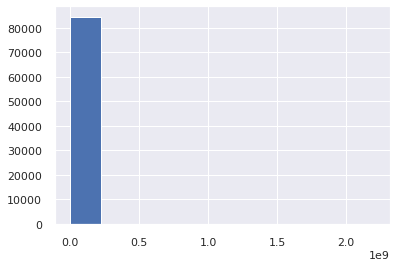

In [ ]:
# Now with histogram graph lets check if the data is normally distributed or not
df_prop['SALE_PRICE'].astype(int).hist()

In [ ]:
# With the graph above we see that the price value '0' has huge count
# so to understand, how a property value can be '0' and how many are they in the Sale Price. do this:
df_prop['SALE_PRICE'].value_counts()

530000.0    14561
0           10228
10            766
450000        427
550000        416
            ...  
6575000         1
279500          1
554500          1
311160          1
409999          1
Name: SALE_PRICE, Length: 10008, dtype: int64

In [ ]:
# Above we see that there are 10228 values which are $0

In [ ]:
1# Let's remove all nonsensically small dollar amount: $0 most commonly from Sale Price column
# Since these sales are actually transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement.

#This will remove all those rows from the dataframe which has $0 in the Sale Price column and rest data will remain as it is.
df_prop = df_prop[df_prop['SALE_PRICE']!=0]
df_prop.shape

(84548, 21)

In [ ]:
#@title Removing unappropriate values

In [ ]:
#Let's also remove observations that have gross square feet less than 400 sq. ft
#Let's also remove observations that have land square feet less than 400 sq. ft
#Let's also remove observations that have sale price less than 10000 dollars

# Iteration 1
df_prop = df_prop[df_prop['GROSS_SQUARE_FEET'].astype(int)>400]
df_prop = df_prop[df_prop['LAND_SQUARE_FEET'].astype(int)>400]
df_prop = df_prop[df_prop['SALE_PRICE'].astype(int)>10000]

#iteration 2 
# You can use other threshold 
df_prop.shape

(64368, 21)

In [ ]:
#@title Working on skew & kurt

In [ ]:
# Lets work on the SALE PRICE now
print(df_prop['SALE_PRICE'].value_counts())
print("Sales Price -Skewness", df_prop['SALE_PRICE'].skew())
print("Sales Price -Kurtosis", df_prop['SALE_PRICE'].kurt())

530000.0    14512
450000        388
550000        374
600000        368
700000        356
            ...  
157170          1
2964634         1
241819          1
165500          1
30426           1
Name: SALE_PRICE, Length: 8739, dtype: int64
Sales Price -Skewness 122.26208746320059
Sales Price -Kurtosis 20579.145594180532


In [ ]:
# The above skew and kurt shows that the data is not normally distributed
# Moreover there are outliers in the Sales price

df_prop[df_prop['SALE_PRICE'].astype(int)==2210000000] # Outlier in Sale Price

,BOROUGH,NEIGHBORHOOD,BUILDING_CLASS_CATEGORY,TAX_CLASS_AT_PRESENT,BLOCK,LOT,BUILDING_CLASS_AT_PRESENT,ADDRESS,APARTMENT_NUMBER,ZIP_CODE,RESIDENTIAL_UNITS,COMMERCIAL_UNITS,TOTAL_UNITS,LAND_SQUARE_FEET,GROSS_SQUARE_FEET,YEAR_BUILT,TAX_CLASS_AT_TIME_OF_SALE,BUILDING_CLASS_AT_TIME_OF_SALE,SALE_PRICE,SALE_DATE,borough_name
7447,1,MIDTOWN CBD,21 OFFICE BUILDINGS,4,1301,1,O4,245 PARK AVENUE,,10167,0,35,10167,81336,1586886,1966,4,O4,2210000000,2017-05-05 00:00:00,Manhattan


**Observation:** The most expensive property in NYC is a whopping 2 billion dollars which can be considered as an outlier.

In [ ]:
# iteration assumption - i don't want to keep higher priced properties in my analysis - we can do a seperate analysis for high rate prop

q = df_prop["SALE_PRICE"].astype(int).quantile(0.95)
q

3600000.0

In [ ]:
# The quantile 0.95  shows mark of properties having price more than $4.5 million, hence we filter data less that 0.95 quantile

df_prop = df_prop[df_prop["SALE_PRICE"].astype(int) < q]

df_prop.shape

(61124, 21)

In [ ]:
df_prop.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING_CLASS_CATEGORY',
       'TAX_CLASS_AT_PRESENT', 'BLOCK', 'LOT', 'BUILDING_CLASS_AT_PRESENT',
       'ADDRESS', 'APARTMENT_NUMBER', 'ZIP_CODE', 'RESIDENTIAL_UNITS',
       'COMMERCIAL_UNITS', 'TOTAL_UNITS', 'LAND_SQUARE_FEET',
       'GROSS_SQUARE_FEET', 'YEAR_BUILT', 'TAX_CLASS_AT_TIME_OF_SALE',
       'BUILDING_CLASS_AT_TIME_OF_SALE', 'SALE_PRICE', 'SALE_DATE',
       'borough_name'],
      dtype='object')

In [ ]:
df_prop = df_prop[df_prop['YEAR_BUILT'] > 1800]
df_prop.shape

(57474, 21)

In [ ]:
#@title Save 4
df_prop4 = df_prop.copy()  # For further experiment we will make and copy and use it, to keep the cleaned data as a safe copy.

In [ ]:
#@title Restore
df_prop = df_prop4.copy()

In [ ]:
#@title Save a copy of cleaned data in CSV
df_prop.to_csv('nyc-sales-cleand.csv')

## Converting Datatype

In [ ]:
#@title Convert to Category

In [ ]:
# Lets convert datatype of the features to the correct form for further analysis

df_prop['NEIGHBORHOOD'] = df_prop.NEIGHBORHOOD.astype('category')
df_prop['BUILDING_CLASS_CATEGORY'] = df_prop.BUILDING_CLASS_CATEGORY.astype('category')
df_prop['TAX_CLASS_AT_PRESENT'] = df_prop.TAX_CLASS_AT_PRESENT.astype('category')
df_prop['BLOCK'] = df_prop.BLOCK.astype('category')
df_prop['LOT'] = df_prop.LOT.astype('category')
df_prop['BUILDING_CLASS_AT_PRESENT'] = df_prop.BUILDING_CLASS_AT_PRESENT.astype('category')
df_prop['ADDRESS'] = df_prop.ADDRESS.astype('category')
df_prop['ZIP_CODE'] = df_prop.ZIP_CODE.astype('category')
df_prop['BUILDING_CLASS_AT_TIME_OF_SALE'] = df_prop.BUILDING_CLASS_AT_TIME_OF_SALE.astype('category')
df_prop['RESIDENTIAL_UNITS'] = df_prop.RESIDENTIAL_UNITS.astype('category')
df_prop['COMMERCIAL_UNITS'] = df_prop.COMMERCIAL_UNITS.astype('category')
df_prop['TOTAL_UNITS'] = df_prop.TOTAL_UNITS.astype('category')


In [ ]:
#@title Convert to float

In [ ]:
df_prop['LAND_SQUARE_FEET'] = df_prop.LAND_SQUARE_FEET.astype(float)
df_prop['GROSS_SQUARE_FEET'] = df_prop.GROSS_SQUARE_FEET.astype(float)
df_prop['SALE_PRICE'] = df_prop.SALE_PRICE.astype(float)


In [ ]:
#@title Convert to datetime

In [ ]:
df_prop['SALE_DATE'] = pd.to_datetime(df_prop['SALE_DATE'], errors='ignore')
df_prop['sales_year'] = df_prop['SALE_DATE'].dt.year
df_prop['sales_month'] = df_prop['SALE_DATE'].dt.month
df_prop['sales_weekday'] = df_prop['SALE_DATE'].dt.weekday_name


In [ ]:
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57474 entries, 1 to 84547
Data columns (total 24 columns):
BOROUGH                           57474 non-null int64
NEIGHBORHOOD                      57474 non-null category
BUILDING_CLASS_CATEGORY           57474 non-null category
TAX_CLASS_AT_PRESENT              57474 non-null category
BLOCK                             57474 non-null category
LOT                               57474 non-null category
BUILDING_CLASS_AT_PRESENT         57474 non-null category
ADDRESS                           57474 non-null category
APARTMENT_NUMBER                  57474 non-null object
ZIP_CODE                          57474 non-null category
RESIDENTIAL_UNITS                 57474 non-null category
COMMERCIAL_UNITS                  57474 non-null category
TOTAL_UNITS                       57474 non-null category
LAND_SQUARE_FEET                  57474 non-null float64
GROSS_SQUARE_FEET                 57474 non-null float64
YEAR_BUILT                  

In [ ]:
df_prop.head()

,BOROUGH,NEIGHBORHOOD,BUILDING_CLASS_CATEGORY,TAX_CLASS_AT_PRESENT,BLOCK,LOT,BUILDING_CLASS_AT_PRESENT,ADDRESS,APARTMENT_NUMBER,ZIP_CODE,RESIDENTIAL_UNITS,COMMERCIAL_UNITS,TOTAL_UNITS,LAND_SQUARE_FEET,GROSS_SQUARE_FEET,YEAR_BUILT,TAX_CLASS_AT_TIME_OF_SALE,BUILDING_CLASS_AT_TIME_OF_SALE,SALE_PRICE,SALE_DATE,borough_name,sales_year,sales_month,sales_weekday
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,C7,234 EAST 4TH STREET,,10009,28,3,10009,4616.0,18690.0,1900,2,C7,530000.0,2016-12-14,Manhattan,2016,12,Wednesday
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,C7,197 EAST 3RD STREET,,10009,16,1,10009,2212.0,7803.0,1900,2,C7,530000.0,2016-12-09,Manhattan,2016,12,Friday
5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,405,16,C4,516 EAST 12TH STREET,,10009,20,0,10009,2581.0,9730.0,1900,2,C4,530000.0,2017-07-20,Manhattan,2017,7,Thursday
6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,406,32,C4,210 AVENUE B,,10009,8,0,10009,1750.0,4226.0,1920,2,C4,3192840.0,2016-09-23,Manhattan,2016,9,Friday
7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,407,18,C7,520 EAST 14TH STREET,,10009,44,2,10009,5163.0,21007.0,1900,2,C7,530000.0,2017-07-20,Manhattan,2017,7,Thursday


# **Data Visualization**

In [ ]:
df_prop.shape

(57474, 24)

## Count of properties in NYC in each bororugh

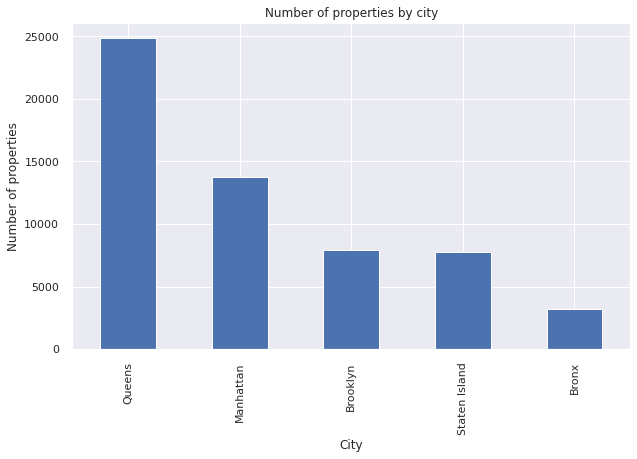

In [ ]:
# Visualizing to see maximum number of properties as per borough name / city name
%matplotlib inline
df_prop.borough_name.value_counts().nlargest(10).plot(kind='bar', figsize=(10,6))
plt.title("Number of properties by city")
plt.ylabel('Number of properties')
plt.xlabel('City');
plt.show()

**Observation:** Queens has maximum properties which is more than 17500 plus

## Distribution of Sale Price

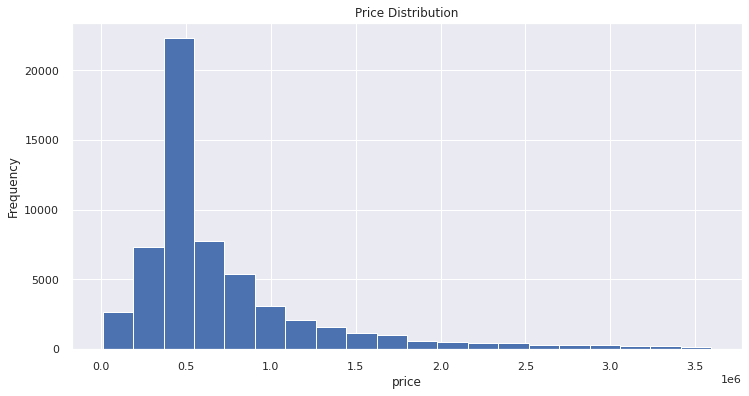

In [ ]:
# Visualizing to see Sale Price Distribution
df_prop['SALE_PRICE'].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('price', fontsize=12)
plt.title('Price Distribution', fontsize=12)
plt.show()

# This plot shows distribution of property sales price in millions as per the describe() module. 
# Hence graph shows data between 0 million to 4.5 million 

**Observation**: The distribution is highly skewed towards the right which implies there are **lesser properties that have a very high prices**.  


In [ ]:
df_prop['SALE_PRICE'].describe()

count    5.747400e+04
mean     7.302099e+05
std      5.574352e+05
min      1.000100e+04
25%      4.500000e+05
50%      5.300000e+05
75%      8.250000e+05
max      3.595164e+06
Name: SALE_PRICE, dtype: float64

**Observation**: The maximum sale price is 3.5 million

## Normalization of y - Data

In [ ]:
# Log Normalization is very important in Y - Class - This is Non-Normal Distribution - Do this - np.log(sales price)
# And to reverse or come back to the original value - do - np.exp(log_price)

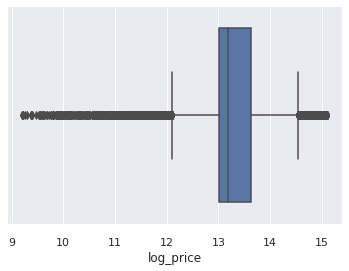

In [ ]:
df_prop["log_price"] = np.log(df_prop["SALE_PRICE"]) # This creates a new column of sales price which is log_price

# Plotting with Seaborn
sns.boxplot(x='log_price', data=df_prop) # Create a box plot to check the log price distribution 


In [ ]:
del df_prop["ADDRESS"] # dropping as it has all unique value

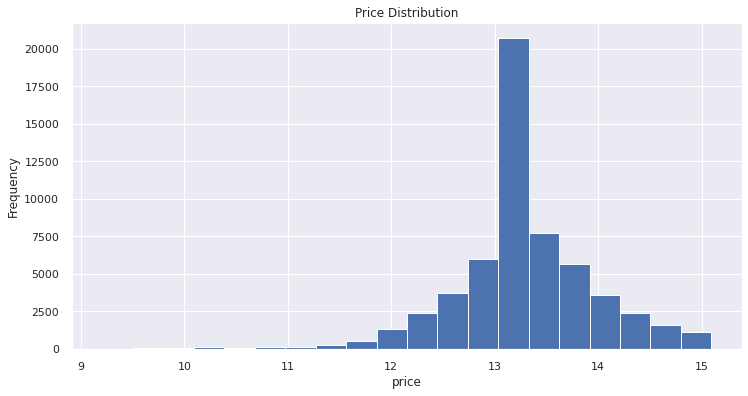

In [ ]:
# Create a hist plot to check the log price distribution again.
# Plotting with matplotlib
df_prop['log_price'].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('price', fontsize=12)
plt.title('Price Distribution', fontsize=12)
plt.show()

In [ ]:
# To revert to the original value from log value, we do np.exp(value)
np.exp(14)

1202604.2841647768

In [ ]:
#skewness and kurtosis    - Acceptable Range -->   -1to 1 , Kurtosis --> -5 to 5 
print("Skewness: %f" % df_prop['SALE_PRICE'].skew())
print("Kurtosis: %f" % df_prop['SALE_PRICE'].kurt())

Skewness: 2.337145
Kurtosis: 6.317378


In [ ]:
#skewness and kurtosis
print("Skewness: %f" % df_prop['log_price'].skew())
print("Kurtosis: %f" % df_prop['log_price'].kurt())

Skewness: -0.475958
Kurtosis: 2.939223


In [ ]:
# Checking
df_prop['log_price'].iloc[1000]

13.670484785914017

In [ ]:
# Cheking with above log
np.exp(df_prop['log_price'].iloc[1000])

865000.0000000002

## Correlation between selected variables

The heat map produces a correlation plot between variables of the dataframe.

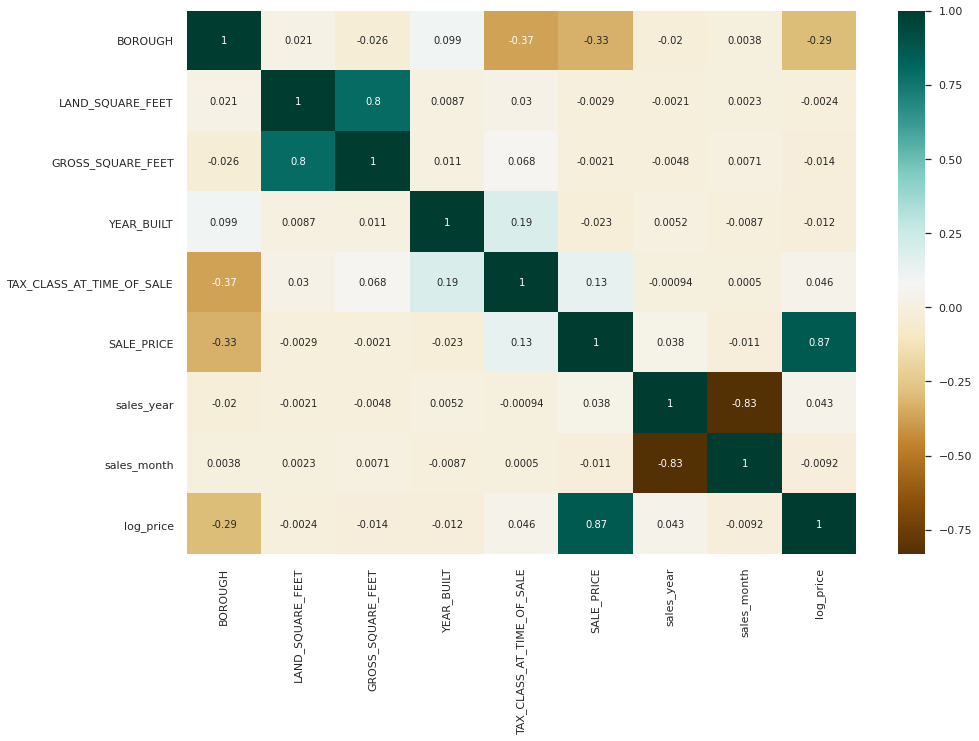

In [ ]:
plt.figure(figsize=(15,10))
c = df_prop.corr()
sns.heatmap(c, cmap="BrBG", annot=True)

**Observation:** 
- Gross Sqft and Land Sqft are highly correlated, hence one can be dropped.
- Sales Price can be dropped as we have log_price
- Also, good to see that Sales price is completly independent.

## Explore how gross square feet affects sale price 

In [ ]:
df_prop.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING_CLASS_CATEGORY',
       'TAX_CLASS_AT_PRESENT', 'BLOCK', 'LOT', 'BUILDING_CLASS_AT_PRESENT',
       'APARTMENT_NUMBER', 'ZIP_CODE', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'TOTAL_UNITS', 'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'SALE_DATE', 'borough_name', 'sales_year', 'sales_month',
       'sales_weekday', 'log_price'],
      dtype='object')

In [ ]:
# Plotting with plotly express
import plotly_express as px

px.scatter(df_prop, x="BOROUGH", y="SALE_PRICE", color="borough_name", size ='GROSS_SQUARE_FEET', 
           hover_data=['LAND_SQUARE_FEET'], size_max=100)

**Observation:** 

- Properties with more total units do not fetch larger sales price
- Properties in Staten Island have comparitively lesser sales price in comparison with other boroughs in New york city

## Explore how tax class at the time of sale affect sales price

In [ ]:
df_prop.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING_CLASS_CATEGORY',
       'TAX_CLASS_AT_PRESENT', 'BLOCK', 'LOT', 'BUILDING_CLASS_AT_PRESENT',
       'APARTMENT_NUMBER', 'ZIP_CODE', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'TOTAL_UNITS', 'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'SALE_DATE', 'borough_name', 'sales_year', 'sales_month',
       'sales_weekday', 'log_price'],
      dtype='object')

In [ ]:
# Plotting with plotly express
px.box(df_prop, x="sales_year", y="SALE_PRICE", color="borough_name", hover_data=['YEAR_BUILT', 'GROSS_SQUARE_FEET'], notched=True)

**Observation:** 

- Manhatten has the highest priced properties that have a tax class 1 representing  residential property of up to three units (such as one-,two-, and three-family homes and small stores or offices with one or two attached apartments) as compared to other boroughs. 
- Properties in Staten Island have comparitively lesser sales price in comparison with other boroughs in New york city

## Explore how week-days effect sales in different borough

In [ ]:
#@title Save 5
df_prop5 = df_prop.copy()

In [ ]:
#@title Restore 5
df_prop = df_prop5.copy()

In [ ]:
# Lets Check the sales as per week days in different borough

px.box(df_prop, x="sales_weekday", y="SALE_PRICE", color="borough_name", hover_name='TAX_CLASS_AT_TIME_OF_SALE', notched=True)

**Observation:** 

- On Saturdays there are no sales for the tax class 4 which represents properties such as  such as offices, factories, warehouses, garage buildings, etc. 

# Model Building

##  Prepare the Data for model building

### Delete columns not necessary for prediction

In [ ]:
df_prop.columns

Index(['BOROUGH', 'NEIGHBORHOOD', 'BUILDING_CLASS_CATEGORY',
       'TAX_CLASS_AT_PRESENT', 'BLOCK', 'LOT', 'BUILDING_CLASS_AT_PRESENT',
       'APARTMENT_NUMBER', 'ZIP_CODE', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'TOTAL_UNITS', 'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'SALE_DATE', 'borough_name', 'sales_year', 'sales_month',
       'sales_weekday', 'log_price'],
      dtype='object')

In [ ]:
# #Dropping few columns
del df_prop['APARTMENT_NUMBER'] # dropping cause it has 65k missing value from 82k data'
del df_prop['SALE_DATE'] # dropping as 3 other features created
del df_prop['borough_name'] # Borough is enough
del df_prop['sales_year']
del df_prop['sales_weekday']

# Correlated features has to be dropped as per correlation heatmap
del df_prop['LAND_SQUARE_FEET'] # Deleting as not required, coz gross sqft is enough.
del df_prop['SALE_PRICE'] # log_price is enough for model


In [ ]:
#@title Save 6
df_prop6 = df_prop.copy()

In [ ]:
#@title Restore 6
df_prop = df_prop6.copy()

In [ ]:
df_prop.shape

(57474, 17)

# Feature Engineering

## Label Encoding Categorical Features

In [ ]:
# Lets check which features needs to be encoded for model
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57474 entries, 1 to 84547
Data columns (total 17 columns):
BOROUGH                           57474 non-null int64
NEIGHBORHOOD                      57474 non-null category
BUILDING_CLASS_CATEGORY           57474 non-null category
TAX_CLASS_AT_PRESENT              57474 non-null category
BLOCK                             57474 non-null category
LOT                               57474 non-null category
BUILDING_CLASS_AT_PRESENT         57474 non-null category
ZIP_CODE                          57474 non-null category
RESIDENTIAL_UNITS                 57474 non-null category
COMMERCIAL_UNITS                  57474 non-null category
TOTAL_UNITS                       57474 non-null category
GROSS_SQUARE_FEET                 57474 non-null float64
YEAR_BUILT                        57474 non-null int64
TAX_CLASS_AT_TIME_OF_SALE         57474 non-null int64
BUILDING_CLASS_AT_TIME_OF_SALE    57474 non-null category
sales_month                    

In [ ]:
#Select the variables for label encoding all categorical features

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

features = ['NEIGHBORHOOD', 'BLOCK', 'LOT', 'ZIP_CODE', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS', 'BUILDING_CLASS_AT_TIME_OF_SALE', 
            'BUILDING_CLASS_AT_PRESENT', 'TAX_CLASS_AT_PRESENT', 'BUILDING_CLASS_CATEGORY', 'TOTAL_UNITS', 'TAX_CLASS_AT_TIME_OF_SALE']

df_encoded = df_prop[features].apply(le.fit_transform)

In [ ]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57474 entries, 1 to 84547
Data columns (total 12 columns):
NEIGHBORHOOD                      57474 non-null int64
BLOCK                             57474 non-null int64
LOT                               57474 non-null int64
ZIP_CODE                          57474 non-null int64
RESIDENTIAL_UNITS                 57474 non-null int64
COMMERCIAL_UNITS                  57474 non-null int64
BUILDING_CLASS_AT_TIME_OF_SALE    57474 non-null int64
BUILDING_CLASS_AT_PRESENT         57474 non-null int64
TAX_CLASS_AT_PRESENT              57474 non-null int64
BUILDING_CLASS_CATEGORY           57474 non-null int64
TOTAL_UNITS                       57474 non-null int64
TAX_CLASS_AT_TIME_OF_SALE         57474 non-null int64
dtypes: int64(12)
memory usage: 5.7 MB


In [ ]:
# Replacing categorical columns with encoded features
fdf = df_prop.drop(features, axis=1) # These are original features whcih we encoded hence dropping them
fdf = pd.concat([fdf, df_encoded], axis=1) #These are new encoded features whcich we are not concatinating/merging with orignal data
fdf.shape

(57474, 17)

In [ ]:
fdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57474 entries, 1 to 84547
Data columns (total 17 columns):
BOROUGH                           57474 non-null int64
GROSS_SQUARE_FEET                 57474 non-null float64
YEAR_BUILT                        57474 non-null int64
sales_month                       57474 non-null int64
log_price                         57474 non-null float64
NEIGHBORHOOD                      57474 non-null int64
BLOCK                             57474 non-null int64
LOT                               57474 non-null int64
ZIP_CODE                          57474 non-null int64
RESIDENTIAL_UNITS                 57474 non-null int64
COMMERCIAL_UNITS                  57474 non-null int64
BUILDING_CLASS_AT_TIME_OF_SALE    57474 non-null int64
BUILDING_CLASS_AT_PRESENT         57474 non-null int64
TAX_CLASS_AT_PRESENT              57474 non-null int64
BUILDING_CLASS_CATEGORY           57474 non-null int64
TOTAL_UNITS                       57474 non-null int64
TAX_CLA

### Standardization & Splitting data into independent feature 'X'  and dependent fearure/label to be predicted as 'y'

In [ ]:
# so we have 11 features in all now
fdf.shape

(57474, 17)

In [ ]:
#Standardize rows into uniform scale

X = fdf.drop(['log_price'], axis=1)
y = fdf['log_price'] # No need to normalise the log_price as it is already being normalised by log

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)

# Scale and center the data
fdf_normalized = scaler.transform(X)

# Create a pandas DataFrame
X = pd.DataFrame(data=fdf_normalized, index=X.index, columns=X.columns)

In [ ]:
X.head()

,BOROUGH,GROSS_SQUARE_FEET,YEAR_BUILT,sales_month,NEIGHBORHOOD,BLOCK,LOT,ZIP_CODE,RESIDENTIAL_UNITS,COMMERCIAL_UNITS,BUILDING_CLASS_AT_TIME_OF_SALE,BUILDING_CLASS_AT_PRESENT,TAX_CLASS_AT_PRESENT,BUILDING_CLASS_CATEGORY,TOTAL_UNITS,TAX_CLASS_AT_TIME_OF_SALE
1,-1.549829,0.557846,-1.540691,1.574012,-1.777965,-1.160634,-0.497245,-1.559375,5.962340,3.337876,-0.322807,-0.322379,0.821216,0.034217,-1.559375,0.884228
2,-1.549829,0.172532,-1.540691,1.574012,-1.777965,-1.160634,-0.459881,-1.559375,3.260665,1.038216,-0.322807,-0.322379,0.821216,0.034217,-1.559375,0.884228
5,-1.549829,0.240732,-1.540691,0.131110,-1.777965,-1.158625,-0.525987,-1.559375,4.161224,-0.111614,-0.397233,-0.396839,0.821216,0.034217,-1.559375,0.884228
6,-1.549829,0.045934,-0.917551,0.708271,-1.777965,-1.158290,-0.480000,-1.559375,1.459549,-0.111614,-0.397233,-0.396839,1.645236,0.034217,-1.559375,0.884228
7,-1.549829,0.639850,-1.540691,0.131110,-1.777965,-1.157956,-0.520239,-1.559375,9.114295,2.188046,-0.322807,-0.322379,0.821216,0.034217,-1.559375,0.884228


In [ ]:
#@title To reverse standardization, we do this:
pd.DataFrame(scaler.inverse_transform(X))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,1.0,18690.0,1900.0,12.0,1.0,342.0,25.0,8.0,2.800000e+01,3.0,20.0,21.0,5.0,6.0,8.0,1.0
1,1.0,7803.0,1900.0,12.0,1.0,342.0,38.0,8.0,1.600000e+01,1.0,20.0,21.0,5.0,6.0,8.0,1.0
2,1.0,9730.0,1900.0,7.0,1.0,348.0,15.0,8.0,2.000000e+01,0.0,17.0,18.0,5.0,6.0,8.0,1.0
3,1.0,4226.0,1920.0,9.0,1.0,349.0,31.0,8.0,8.000000e+00,0.0,17.0,18.0,7.0,6.0,8.0,1.0
4,1.0,21007.0,1900.0,7.0,1.0,350.0,17.0,8.0,4.200000e+01,2.0,20.0,21.0,5.0,6.0,8.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57469,5.0,1800.0,1997.0,12.0,248.0,6418.0,40.0,55.0,2.000000e+00,0.0,12.0,13.0,1.0,1.0,55.0,0.0
57470,5.0,2575.0,1998.0,11.0,248.0,6427.0,33.0,55.0,2.000000e+00,0.0,12.0,13.0,1.0,1.0,55.0,0.0
57471,5.0,2377.0,1998.0,4.0,248.0,6427.0,77.0,55.0,2.000000e+00,0.0,12.0,13.0,1.0,1.0,55.0,0.0
57472,5.0,1496.0,1925.0,7.0,248.0,6429.0,59.0,55.0,2.000000e+00,0.0,10.0,11.0,1.0,1.0,55.0,0.0


## **This case study is only for the purpose of Exploratory Data Analysis**
#### - For Linear Regerssion ML results pleas click on [Linear Regression - Case Study: NYC Property Sale](https://github.com/sanu1230/Machine-Learning/blob/master/Linear_Regression_Case_Study_NYC_Property_Sales.ipynb)

#### - For more Visuals on this data click on link to Tableau [link text](https:// [link text](https://))